# **Import**

In [ ]:
import shutil

zip_file_path = '/content/drive/MyDrive/archive (1).zip'
extract_folder_path = '/content/drive/MyDrive'

shutil.unpack_archive(zip_file_path, extract_folder_path, format='zip')

In [ ]:
!pip install tensorflow-addons


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.3/612.3 kB 8.4 MB/s eta 0:00:00


In [ ]:
# Common
import os
import keras
import numpy as np
import pandas as pd
import tensorflow as tf
from IPython.display import clear_output as cls

# Data Loading
from keras.preprocessing.image import ImageDataGenerator as IDG

# Data Loading
import plotly.express as px
import matplotlib.pyplot as plt

# Model
from keras.layers import add
from keras.layers import Dense
from keras.layers import Layer
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers import MaxPooling2D as  MP
from keras.layers import ZeroPadding2D as  ZP
from keras.layers import LayerNormalization as LN
from keras.layers import MultiHeadAttention as MHA
from keras.models import Sequential, Model

# Optimizer
from tensorflow_addons.optimizers import AdamW

# Model Visualization
from tensorflow.keras.utils import plot_model

# Metrics
from keras.metrics import SparseCategoricalAccuracy as Accuracy, SparseTopKCategoricalAccuracy as TopKAccuracy

# Dataset
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


# **Hyperparameters**

Before moving ahead let's define some **Hyperparameters and Constants**.

In [ ]:
Learning_Rate = 1e-3
Weight_Decay  = 1e-4
FILTERS       = [64,128]
Drop_Rates    = [0.0,0.1]
Dims          = 128
Hidden_units  = [Dims, Dims]
IMAGE_SIZE    = 160

# **Functions**

In [ ]:
def show_images(data, class_names, model=None, GRID=[5,6], SIZE=(30,25)):

    # Plotiing Configuration
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)

    # iterate through the data
    i=1
    for images, labels in iter(data):

        # Select data at random
        id = np.random.randint(len(images))
        image, label = tf.expand_dims(images[id],axis=0), class_names[int(labels[id])]

        # Make Prediciton
        if model is not None :
            prediction = model.predict(image)[0]
            score = np.round(np.max(prediction),2)
            pred  = class_names[np.argmax(prediction)]

            title = "True : {}\nPred : {}\n Score : {:.2}".format(label, pred, score)

        else:
            title = label
        cls()

        # Plot Image
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image[0])
        plt.axis('off')
        plt.title(title)

        # Break loop
        i+=1
        if i>n_images: break

    # Show Final Figure
    plt.show()

# **Data Distribution**

Before loading the data. Let's have a look at the **class distribution**.

In [ ]:
# Specify the Root Paths
train_path = '/content/drive/MyDrive/train'
valid_path = '/content/drive/MyDrive/valid/'

In [ ]:
# get the Class Names
class_names = sorted(os.listdir(train_path))
n_classes   = len(class_names)

# Show
print("No. of Classes : {}\nClass Names : {}".format(n_classes, class_names))

No. of Classes : 11
Class Names : ['Bacterial_spot', 'Early_blight', 'Late_blight', 'Leaf_Mold', 'Septoria_leaf_spot', 'Spider_mites Two-spotted_spider_mite', 'Target_Spot', 'Tomato_Yellow_Leaf_Curl_Virus', 'Tomato_mosaic_virus', 'healthy', 'powdery_mildew']


Each class denotes a **type of disease of the tomato leaves**. Let's have a look at the **total number of images** present in each class. That is the **class distribution**.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Calculate the Class Distribution
class_dis = [len(os.listdir(train_path)) for name in class_names]

# Visualization
fig = px.pie(names=class_names, values=class_dis, hole=0.4)
fig.update_layout({'title':{'text':"Training Class Distribution","x":0.42}})
fig.show()

fig = px.bar(y=class_names, x=class_dis, color=class_names)
fig.show()

In [ ]:
# Calculate the Class Distribution
class_dis = [len(os.listdir(valid_path)) for name in class_names]

# Visualization
fig = px.pie(names=class_names, values=class_dis, hole=0.4)
fig.update_layout({'title':{'text':"Validation Class Distribution","x":0.42}})
fig.show()

fig = px.bar(y=class_names, x=class_dis, color=class_names)
fig.show()

# **Data Loading**

We are aware of the class distribution. It's time to **load the data**.

In [ ]:
# Initialize the Generator
train_gen, valid_gen = IDG(rescale=1./255, rotation_range=10, horizontal_flip=True), IDG(rescale=1./255)

# load data
train_ds = train_gen.flow_from_directory(train_path, target_size=(IMAGE_SIZE, IMAGE_SIZE), shuffle=True, class_mode='binary', batch_size=32)
valid_ds = train_gen.flow_from_directory(valid_path, target_size=(IMAGE_SIZE, IMAGE_SIZE), shuffle=True, class_mode='binary', batch_size=32)

Found 25851 images belonging to 11 classes.
Found 6684 images belonging to 11 classes.


# **Data Visualization**

We have the data in hand. Let's have a look at some images from the data.

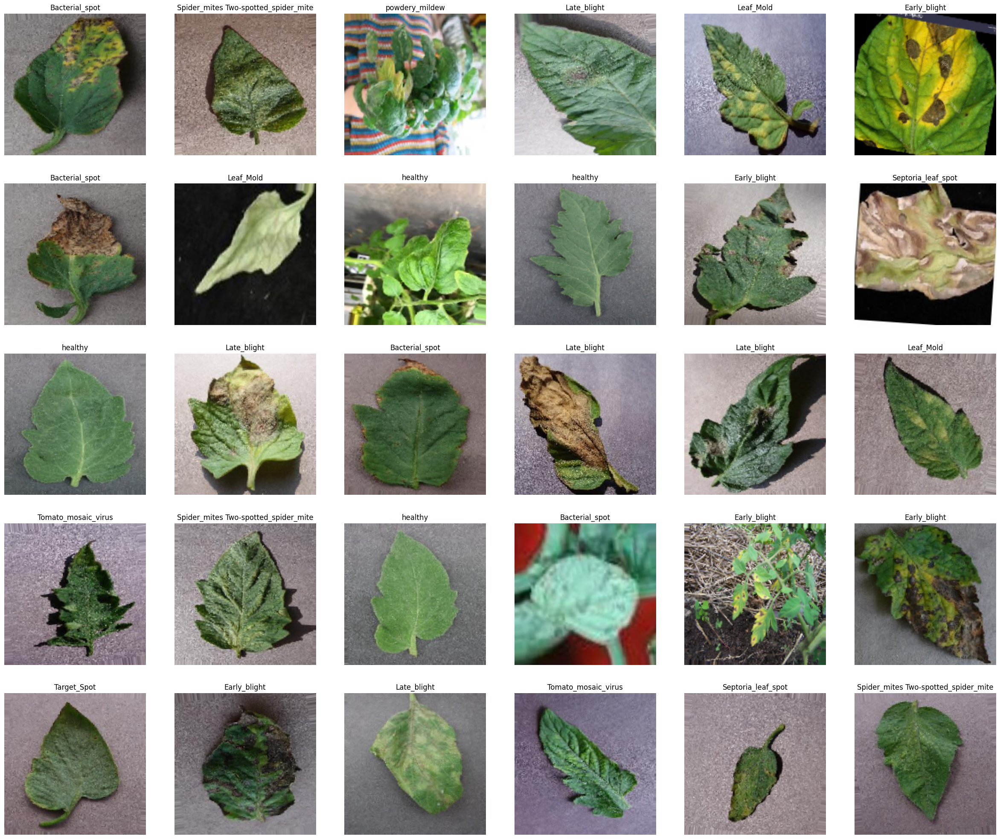

In [ ]:
show_images(data=train_ds, class_names=class_names)

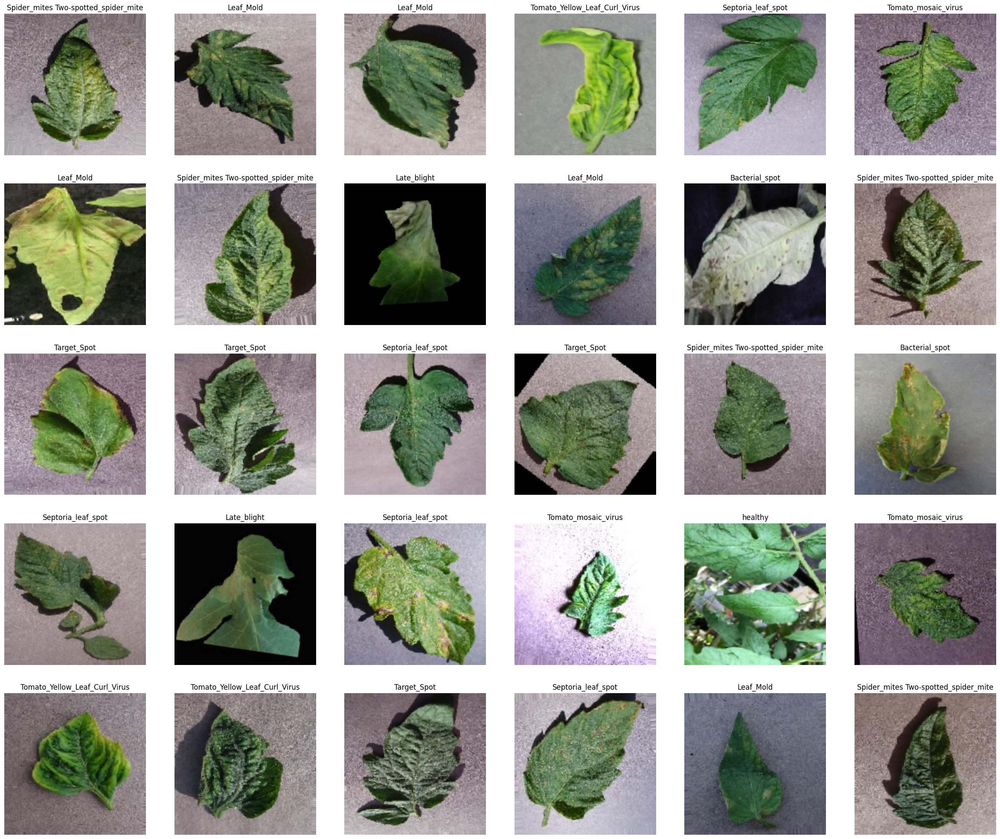

In [ ]:
show_images(data=valid_ds, class_names=class_names)

# **Compact Convolutional Transformers**

The base of **CCT is the convolutional patch converter**. Here we define the **Convolutional Tokenizer**.

In [ ]:
class ConvTokenizer(Layer):

    def __init__(self, filters, **kwargs):
        super(ConvTokenizer, self).__init__(**kwargs)

        self.net = Sequential([
            Conv2D(filters[0], kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='he_normal', use_bias=False, name="TokenizerConv1"),
            ZP(padding=1, name="ZP1"),
            MP(pool_size=3, strides=2, padding='same', name="MP1"),
            Conv2D(filters[1], kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='he_normal', use_bias=False, name="TokenizerConv2"),
            ZP(padding=1, name="ZP2"),
            MP(pool_size=3, strides=2, padding='same', name="MP2"),
        ], name="ConvTokenizer")

        self.filters = filters

    def call(self, X):
        patches = self.net(X)
        batch_size = tf.shape(patches)[0]
        patches = tf.reshape(patches, shape=(batch_size, -1, patches.shape[-1]))
        return patches

    def PE(self, IMAGE_SIZE):
        dummy_inputs  = tf.ones(shape=(1, IMAGE_SIZE, IMAGE_SIZE, 3))
        dummy_outputs = self.call(dummy_inputs)

        seq_len  = tf.shape(dummy_outputs)[1]
        proj_dim = tf.shape(dummy_outputs)[-1]
        EL = Embedding(input_dim=seq_len, output_dim=proj_dim, name="PositionalEmbedding")
        return EL, seq_len

    def get_config(self):
        base_config = super().get_config()
        return {**base_config, "filters": self.filters}


# **Sequence Pooling**

The authors also introduces a **new method called sequence pooling**, which will **pool down the encodings of the transformer**.

In [ ]:
def SeqPool(x):

    rep = LN(epsilon=1e-5, name="LayerNormSeqPool")(x)
    y   = Dense(1, name="LinearTransformation")(rep)

    attention_weights = tf.nn.softmax(y, axis=-1)
    weighted_rep = tf.squeeze(tf.matmul(attention_weights, rep, transpose_a=True),axis=-2)
    return weighted_rep

# **MLP Block**

This is used to create the **dense block, or the MLP** present in the **transformer encoder**.

In [ ]:
class MLPBlock(Layer):

    def __init__(self, units, rate, **kwargs):
        super(MLPBlock, self).__init__(**kwargs)

        self.units = units
        self.rate = rate

        self.net = Sequential(name='MLPBlock')
        for unit in units:
            self.net.add(Dense(unit, activation='relu', kernel_initializer='he_normal'))
            self.net.add(Dropout(rate))

    def call(self, X):
        return self.net(X)

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "units":self.units,
            "rate":self.rate
        }

# **Stochastic Depth Regularization**

**Stochastic depth** is a **regularization technique** that randomly drops a set of layers. During inference, the layers are kept as they are. It is very much **similar to Dropout** but only that it operates on a **block of layers rather than individual nodes present inside a layer**. In **CCT**, **stochastic depth** is used just before the **residual blocks of a Transformers encoder**.

In [ ]:
class StochasticDepthRegularization(Layer):

    def __init__(self, drop_rate, **kwargs):
        super(StochasticDepthRegularization, self).__init__(**kwargs)

        self.dr = drop_rate

    def call(self, x, training=None):
        if training:
            keep_rate = 1 - self.dr
            shape = (tf.shape(x)[0],) + (1,) * (tf.shape(x).shape[0] - 1)
            random_tensor = keep_rate + tf.random.uniform(shape, 0, 1)
            random_tensor = tf.floor(random_tensor)
            return (x / keep_rate) * random_tensor
        return x

# **Transformer Block**

This is the **transformer block**, which consists of the **self attention module** and the **MLP encoder**.

In [ ]:
def TransformerBlock(x, rates=Drop_Rates, L=2, proj_dim=Dims):
    for i in range(L):
        y = LN(epsilon=1e-5, name="LayerNormTB_Lower_{}".format(i+1))(x)
        y = MHA(num_heads=2, key_dim=Dims, dropout=0.1, name="MHA_{}".format(i+1))(y, y)
        y = StochasticDepthRegularization(drop_rate=rates[i],name="SDR_Lower_{}".format(i+1))(y)

        skip = add([y, x], name="SkipConnection_Lower_{}".format(i+1))

        y = LN(epsilon=1e-5, name="LayerNormTB_Top_{}".format(i+1))(skip)
        y = MLPBlock(Hidden_units, 0.1, name="MLPBlock_TB_{}".format(i+1))(y)
        y = StochasticDepthRegularization(drop_rate=rates[i],name="SDR_Top_{}".format(i+1))(y)

        x = add([y, skip], name="SkipConnection_Top_{}".format(i+1))
    return x

# **CCT - Model Architecture**

In [ ]:
# Input Layer
InputL = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="InputLayer")

# Tokenizer
Tokenizer = ConvTokenizer(filters=FILTERS, name="ConvTokenizer")
tokens    = Tokenizer(InputL)


# Positional Embeddings
EL, seq_len = Tokenizer.PE(IMAGE_SIZE)
positions   = tf.range(start=0, limit=seq_len, delta=1)
embedding   = EL(positions)
tokens     += embedding

# Transformer Block
encodings = TransformerBlock(tokens)

# Sequence Pooling
pooled = SeqPool(encodings)

# Classifier
OutputL = Dense(n_classes, activation='softmax', name="OutptLayer")(pooled)

# Model
model = Model(InputL, OutputL, name="CCT")
model.summary()

Model: "CCT"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 InputLayer (InputLayer)     [(None, 160, 160, 3)]        0         []                            
                                                                                                  
 ConvTokenizer (ConvTokeniz  (None, None, 128)            75456     ['InputLayer[0][0]']          
 er)                                                                                              
                                                                                                  
 tf.math.add (TFOpLambda)    (None, 1600, 128)            0         ['ConvTokenizer[0][0]']       
                                                                                                  
 LayerNormTB_Lower_1 (Layer  (None, 1600, 128)            256       ['tf.math.add[0][0]']       

# **CCT - Model Visualization**

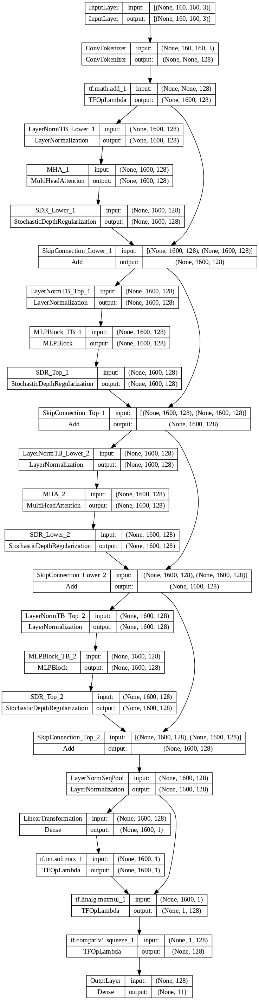

In [ ]:
plot_model(model, "CCT.png", dpi=100, show_shapes=True)

# **CCT - Training**

In [ ]:
# Compile
opt = AdamW(learning_rate=Learning_Rate, weight_decay=Weight_Decay)
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=opt,
    metrics=[
        Accuracy(name="Top1Accuracy"), TopKAccuracy(k=3, name="Top3Accuracy")
    ]
)

In [ ]:
history = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=10
)

Epoch 1/10
808/808 [==============================] - 461s 567ms/step - loss: 209.5746 - Top1Accuracy: 0.1898 - Top3Accuracy: 0.6312 - val_loss: 90.9604 - val_Top1Accuracy: 0.1914 - val_Top3Accuracy: 0.7141
Epoch 2/10
808/808 [==============================] - 461s 571ms/step - loss: 42.3911 - Top1Accuracy: 0.3635 - Top3Accuracy: 0.6714 - val_loss: 32.8684 - val_Top1Accuracy: 0.3478 - val_Top3Accuracy: 0.7549
Epoch 3/10
808/808 [==============================] - 458s 566ms/step - loss: 25.8361 - Top1Accuracy: 0.4953 - Top3Accuracy: 0.7867 - val_loss: 40.3064 - val_Top1Accuracy: 0.3855 - val_Top3Accuracy: 0.7702
Epoch 4/10
808/808 [==============================] - 458s 567ms/step - loss: 19.8935 - Top1Accuracy: 0.5650 - Top3Accuracy: 0.8361 - val_loss: 13.9746 - val_Top1Accuracy: 0.6315 - val_Top3Accuracy: 0.8758
Epoch 5/10
808/808 [==============================] - 465s 575ms/step - loss: 13.5285 - Top1Accuracy: 0.6274 - Top3Accuracy: 0.8701 - val_loss: 15.0162 - val_Top1Accuracy: 0.6

# **CCT - Learning Curve**

In [ ]:
# Save the trained model
model.save('/content/drive/MyDrive/trained_model1.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



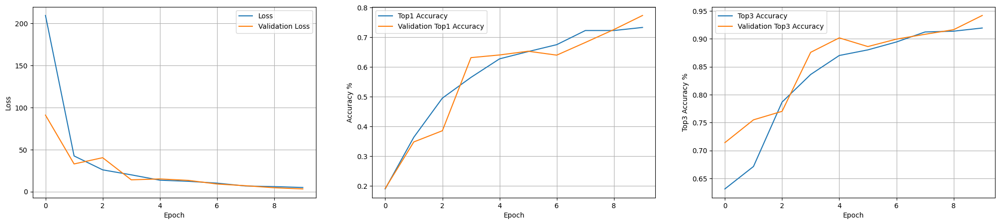

In [ ]:
# Learning curve figure
plt.figure(figsize=(25,5))

# Subplot
plt.subplot(1,3,1)
plt.plot(lc['loss'], label='Loss')
plt.plot(lc['val_loss'], label='Validation Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.plot(lc['Top1Accuracy'], label='Top1 Accuracy')
plt.plot(lc['val_Top1Accuracy'], label='Validation Top1 Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Accuracy %")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.plot(lc['Top3Accuracy'], label='Top3 Accuracy')
plt.plot(lc['val_Top3Accuracy'], label='Validation Top3 Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Top3 Accuracy %")
plt.legend()
plt.grid()

plt.show()

# **CCT - Predictions**

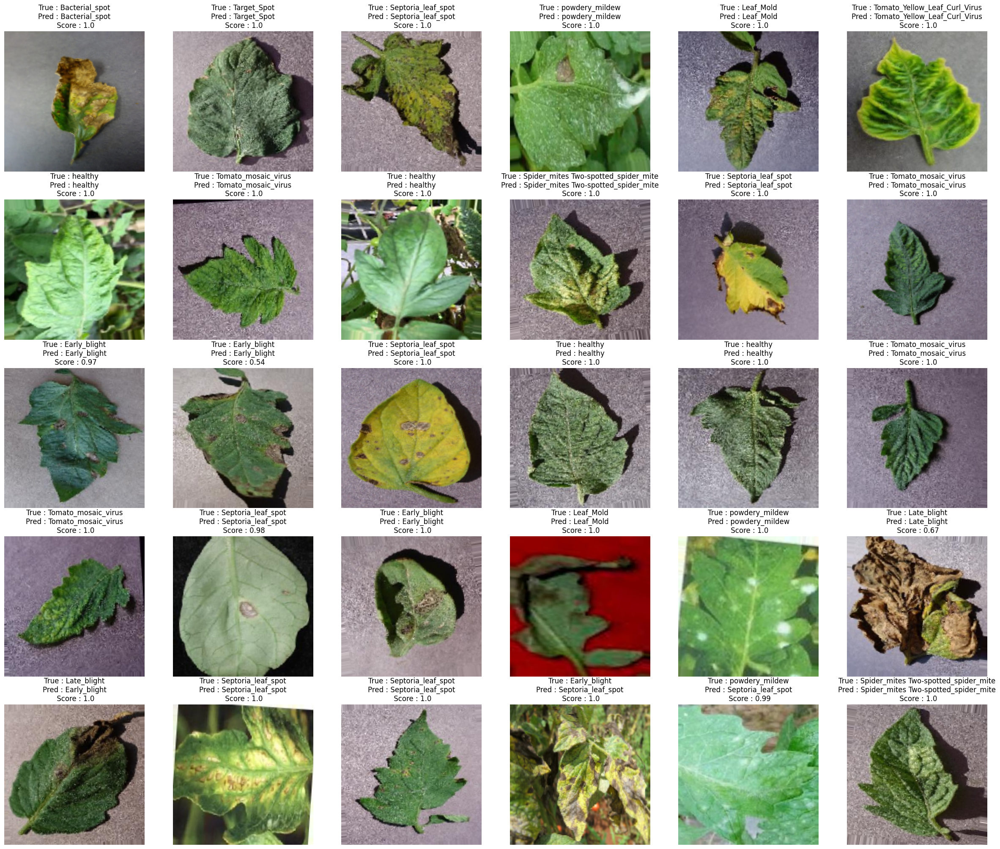

In [ ]:
show_images(data=valid_ds, class_names=class_names, model=model)